In [50]:
#Install this package to be able to watch the 3D plots
!pip install ffmpeg

# Exploratory Data Analysis

This notebook contains exploratory data analysis for the dataset that was preprocessed in the earlier notebooks. For more information on the data itself, such as its collection methodology, please see the following article: https://www.nature.com/articles/s41746-020-0226-6

__INPUT: .csv file that contains all sensor data for each subject's performed activities. Sensor readings at a given timepoint must be labeled with the activity that was performed at that time as well as what subject was performing the activity.__ 

## Table of Contents


* [Activity Label Counts](#counts)
* [Sensor Reading Distributions](#dist)
* [Outliers by Activity](#outact)
* [Outliers by Time](#outtime)
* [Correlations Between Sensors](#corr)
* [Comparing Rest and Deep Breathing](#restdb)
* [Comparing Rest and Activity](#restact)
* [Plot by Sensor](#pbs)
* [Clustering on Sensor Summary Statistics](#cluster)
* [3D Animation of Accelerometer](#3D)




***

## SUMMARY

The four activities we wish to classify are activity, baseline, deep breathing, and typing. The sensors we used are triaxal accelerometry(ACC1, 2, 3), a magnitude of the three accelerometer axes (Magnitude), heart rate (HR), skin temperature (TEMP), blood volume pulse (BVP), and electrodermal activity (EDA). For more details on each activity and the sensors used, please see the article linked above. 

From our exploratory data analysis, we gathered the following information:

1. There is major class imbalance between the four activities. Deep breathing and typing have far less timepoints compared to activity and baseline due to the amount of time each participant performed each activity in the experiment. Since deep breathing, typing, and baseline seem to be qualitatively similar, this combined with class imbalance may make differentiating between these three classes difficult.


2. By visual inspection of distributions, the sensors that have the most variability between activity type are accelerometry (including magnitude) and heart rate. There are also sensor differences between Round 1 and Round 2 for each activity. Variability of sensor readings between activities makes classification possible. Having more variability within the same activity class can help our model generalize to new datasets.


3. We took note of extreme values relative to individual subjects for a given activity, and relative to all subject for a single activity. We take note of this data in case that data is difficult to classify later. There were no datapoints that were obviously a sensor malfunction due to physiological impossibility.


4. There are differences in the distribution of sensor readings between rounds of the same activity. This difference was assessed through visual inspection. The length of rounds is the same, so there will not be bias toward one round. These "differences" are a result of intraclass variability and in theory will aid in extracting representative features.


5. There were no major fluctuations in heart rate or skin temperature over the course of an activity round.


6. Clustering subjects with summary statistics of their sensor data did not yield valuable results.

## Imports

In [51]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px
#from pandas_profiling import ProfileReport
#%matplotlib inline
from matplotlib import animation
from IPython.display import HTML
import mpl_toolkits.mplot3d.axes3d as p3
import warnings
warnings.simplefilter("ignore")
%config InlineBackend.figure_format = 'retina'

## Prepare Data for Analysis

In [52]:
df = pd.read_csv("30_all_partic_aggregated_with_activity.csv") # "Data is available upon request. 
#Please contact Brinnae Bent (brinnae.bent@duke.edu) or Dr. Jessilyn Dunn (jessilyn.dunn@duke.edu) for data"

In [53]:
df['Time'] = pd.to_datetime(df['Time']) #get time in pandas datetime format
df['Magnitude'] =  np.sqrt(df['ACC1']**2 + df['ACC2']**2 + df['ACC3']**2) #create magnitude feature
df = df[['Time', 'Subject_ID', 'ACC1', 'ACC2', 'ACC3', 'Magnitude', 'TEMP', 'EDA', 'BVP', 'HR', 'Activity']] #order cols
df.head()

,Time,Subject_ID,ACC1,ACC2,ACC3,Magnitude,TEMP,EDA,BVP,HR,Activity
0,2019-07-17 11:52:00.000,19-001,41.0,27.2,40.0,63.410094,32.39,0.275354,15.25,78.980,Baseline 1
1,2019-07-17 11:52:00.250,19-001,41.0,27.3,40.0,63.453054,32.39,0.276634,-12.75,78.835,Baseline 1
2,2019-07-17 11:52:00.500,19-001,41.0,27.4,40.0,63.496142,32.39,0.270231,-42.99,78.690,Baseline 1
3,2019-07-17 11:52:00.750,19-001,41.0,27.5,40.0,63.539358,32.39,0.270231,18.39,78.545,Baseline 1
4,2019-07-17 11:52:01.000,19-001,41.0,27.6,40.0,63.582702,32.34,0.268950,13.61,78.400,Baseline 1


#### Create a seperate dataframe that does not have distinction between activity rounds

In [54]:
df1= df.copy()
df1['Activity'] = df['Activity'].str.replace('\d+', '').str.rstrip()

In [55]:
df1.head()

,Time,Subject_ID,ACC1,ACC2,ACC3,Magnitude,TEMP,EDA,BVP,HR,Activity
0,2019-07-17 11:52:00.000,19-001,41.0,27.2,40.0,63.410094,32.39,0.275354,15.25,78.980,Baseline
1,2019-07-17 11:52:00.250,19-001,41.0,27.3,40.0,63.453054,32.39,0.276634,-12.75,78.835,Baseline
2,2019-07-17 11:52:00.500,19-001,41.0,27.4,40.0,63.496142,32.39,0.270231,-42.99,78.690,Baseline
3,2019-07-17 11:52:00.750,19-001,41.0,27.5,40.0,63.539358,32.39,0.270231,18.39,78.545,Baseline
4,2019-07-17 11:52:01.000,19-001,41.0,27.6,40.0,63.582702,32.34,0.268950,13.61,78.400,Baseline


In [56]:
df1.to_csv('20_combined_rounds.csv') #saving the data to use in models later, or to be preprocessed more...
                                     #...before model use

The exploratory data analysis will (occasionally) use the distinction between rounds, but the model will not.

## Basic Aspects of the Data

In [57]:
df.shape #296128 timepoints, one for each quarter second
         #Columns are the time, Subject_ID, the sensors, and the activity label for that timepoint

(296128, 11)

In [58]:
df.describe() #summary statistics for sensor data

,ACC1,ACC2,ACC3,Magnitude,TEMP,EDA,BVP,HR
count,296128.000000,296128.000000,296128.000000,296128.000000,296128.000000,296128.000000,296128.000000,296128.000000
mean,7.044840,8.721990,22.446065,67.363438,33.073147,4.005609,2.432911,86.210094
std,40.068802,40.582922,28.340946,12.139785,1.434968,7.898337,82.166391,15.311803
min,-128.000000,-128.000000,-128.000000,6.403124,26.650000,0.000000,-1722.290000,48.200000
25%,-28.000000,-12.750000,3.013695,61.290750,32.210000,0.199791,-17.300000,75.792500
50%,15.000000,6.500000,23.761634,64.790838,33.340000,1.311807,1.220000,84.557500
75%,39.692308,33.692308,46.478172,71.762101,34.150000,4.207658,20.610000,96.188125
max,127.000000,127.000000,127.000000,214.946505,36.430000,77.247574,1836.170000,163.220000


In [59]:
df.sample(5)

,Time,Subject_ID,ACC1,ACC2,ACC3,Magnitude,TEMP,EDA,BVP,HR,Activity
294438,2019-08-16 16:09:13.500,19-056,14.000000,42.000000,54.000000,69.828361,32.31,0.298406,-0.93,102.455,Activity 1
155795,2019-08-02 20:14:24.750,19-030,-33.333333,-29.400000,38.066667,58.519588,32.53,0.161360,43.82,81.045,Activity 1
183322,2019-08-05 20:22:56.500,19-035,13.000000,84.400000,-0.600000,85.397424,33.93,0.862187,190.93,105.940,Activity 1
215435,2019-08-12 10:39:32.500,19-041,-43.000000,-91.000000,28.000000,104.470091,32.18,11.758676,-3.71,84.010,Activity 2
206414,2019-08-06 20:56:30.500,19-040,37.387755,38.553936,35.256560,64.243873,33.79,0.094773,0.30,81.785,Baseline 1


## Activity Label Counts
<a id="counts"></a>

The following plot shows the distribution of activity data prior to removal of any subjects. The rounds are combined in this first figure.

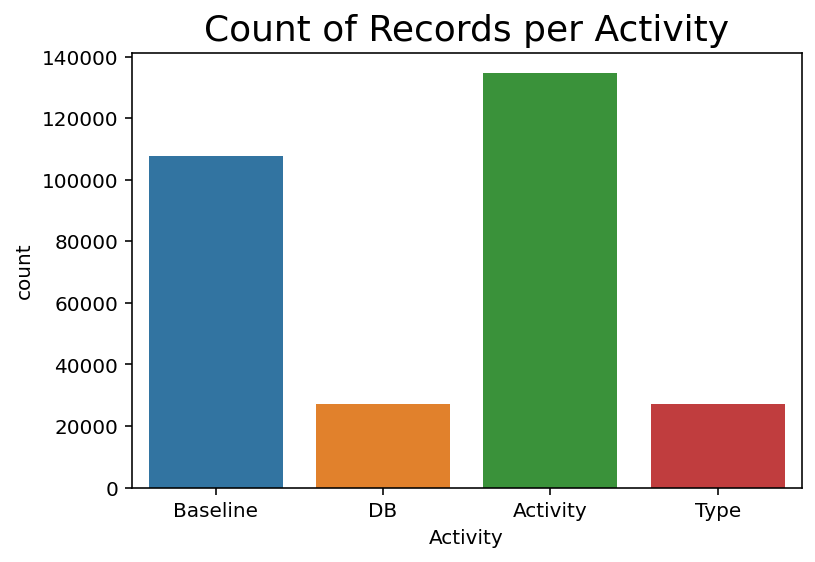

In [60]:
plt.ylabel("Number of Records")
plt.xlabel("Activity")
plt.title("Count of Records per Activity", size = 18)

ax = sns.countplot(x="Activity", data=df1)
plt.show()

Baseline lasted 4 minutes per round, Activity lasted for 5 minutes, and Deep Breathing and Type lasted for 1 minute. Each subject did two rounds of each activity.

Imbalance of timepoints has the potential to cause problems in model evaluation. Scores like accuracy will be biased by how well the prevalent classes are doing unless accuracy per class is considered. Evaluation issues could also be attenuated by looking past accuracy for more specific and robust measures. Parameter weighting schemes (class weighting) and sampling techniques can reduce the effects of imbalance.

Time-relevant data can be expressed as individual timepoints or windows. Rolling methods can capture time-relevant features and express them as a single datapoint. Summary statistics can also be used to capture features of a time window. Deep learning models make it possible to consider an entire window for each classification. Features generated by deep learning on windows may be able to capture aspects of timeseries data that summary statistics and rolling features cannot. 

Using less data from the baseline and activity classes may be a good option for reducing imbalance. This technique can be used for windows and individual datapoints, but the reduction in the total amount of data may hinder model performance.

Data augmentation techniques such as SMOTE could be used to synthesize more data for underrepresented classes. 

__Below is a graph that shows the total timepoints for each activity round. Because round length is equal, combining activity rounds into one label will not be biased towards one round even if the distribution of points between rounds is different.__

Text(0.5, 1.0, 'Count of Records per Activity')

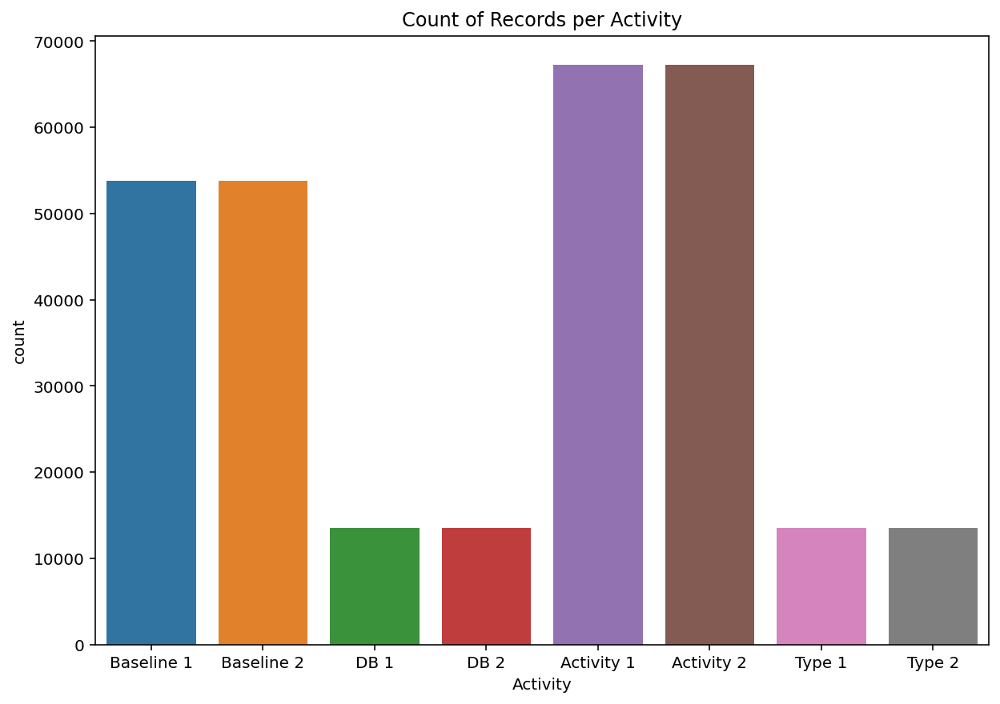

In [61]:
fig_dim = (10,7)
fig, ax = plt.subplots(figsize = fig_dim)
sns.countplot(x = "Activity", data = df).set_title("Count of Records per Activity")


## Sensor Reading Distributions
<a id="dist"></a>

This set of plots displays how sensor readings are distributed differently for separate activities. It appears through visual inspection that Accelerometry and Heart Rate data have the most interclass variability, which may help in classification.




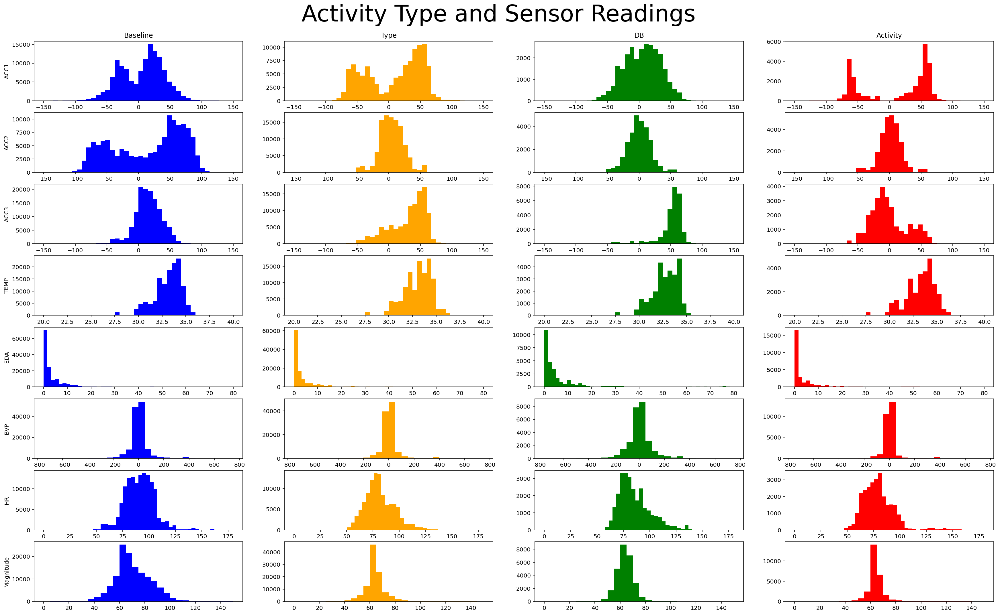

In [62]:
ac_list = ['Baseline', 'Type', 'DB', 'Activity' ]
sense_list = ['ACC1', 'ACC2', 'ACC3', 'TEMP', 'EDA', 'BVP', 'HR', 'Magnitude']

nrows = 8
ncols = 4
fig, ax = plt.subplots(nrows, ncols, figsize = (30,18))
colors = ['Blue','Orange','Green','Red']
for j in range(ncols):
    dfw = df1[df1["Activity"] == ac_list[j-1]] 
    color = colors[j]
    for i in range(nrows):
        if i == 0:
            ax[i,j].hist(dfw["ACC1"],40, range = [-150, 150], color = color)
        elif i == 1:
            ax[i,j].hist(dfw['ACC2'], 40, range = [-150, 150], color = color)
        elif i == 2:
            ax[i,j].hist(dfw['ACC3'], 40, range = [-150, 150], color = color)
        elif i == 3:
            ax[i,j].hist(dfw['TEMP'], 40, range = [20, 40], color = color)
        elif i == 4:
            ax[i,j].hist(dfw['EDA'], 50, range = [0, 80], color = color)
        elif i == 5:
            ax[i,j].hist(dfw['BVP'], 30, range = [-750, 750], color = color)
        elif i == 6:
            ax[i,j].hist(dfw['HR'], 50, range = [0, 180], color = color)
        else:
            ax[i,j].hist(dfw['Magnitude'], 30, range = [0, 150], color = color)
            
for i in range(ncols):
    ax[0,i].set_title(ac_list[i])
    
for j in range(nrows):
    ax[j,0].set(ylabel = sense_list[j])

plt.suptitle("Activity Type and Sensor Readings", size = 40, y = 0.93)
plt.show()

The previous distributions came from combining activity rounds into one label. Below compares activity rounds and their combination by sensor. The axes are flipped to provide easier comparison between activities.

In [63]:
a1 = df.loc[df['Activity'] == 'Activity 1']
a2 = df.loc[df['Activity'] == 'Activity 2']
a = pd.concat([a1,a2])
a['Activity'] = 'Activity'
b1 = df.loc[df['Activity'] == 'Baseline 1']
b2 = df.loc[df['Activity'] == 'Baseline 2']
b = pd.concat([b1,b2])
b['Activity'] = 'Baseline'
d1 = df.loc[df['Activity'] == 'DB 1']
d2 = df.loc[df['Activity'] == 'DB 2']
d = pd.concat([d1,d2])
d['Activity'] = 'DB'
t1 = df.loc[df['Activity'] == 'Type 1']
t2 = df.loc[df['Activity'] == 'Type 2']
t = pd.concat([t1,t2])
t['Activity'] = 'Type'
df_total = pd.concat([a1,a2,a,b1,b2,b,d1,d2,d,t1,t2,t])

In [65]:
ac_list_rounds = ['Baseline 1', 'Baseline 2', 'Baseline', 'Type 1', 'Type 2', 'Type', 'DB 1', 'DB 2', 'DB', 'Activity 1', 'Activity 2', 'Activity' ]

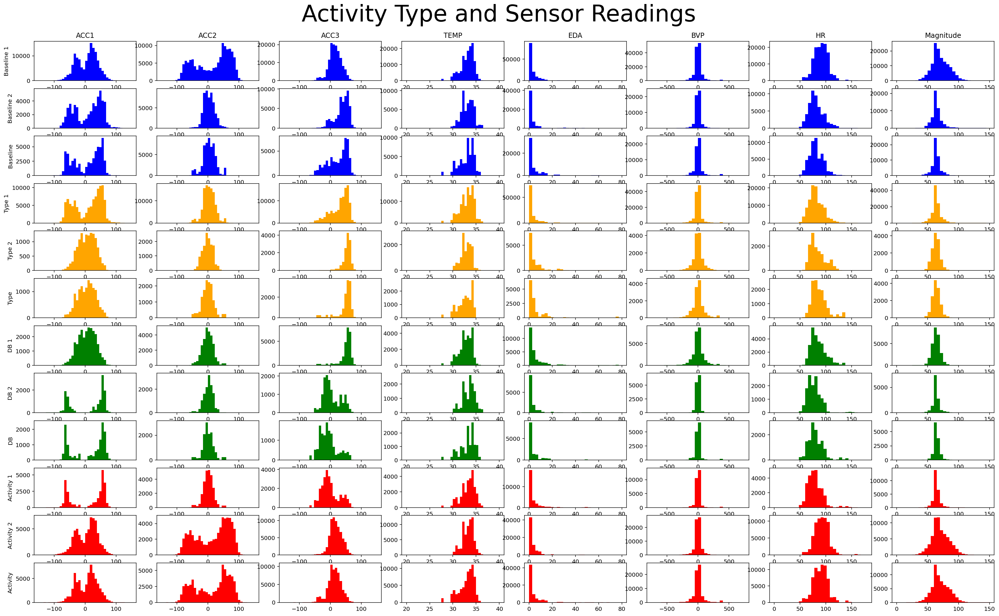

In [66]:
nrows = 12
ncols = 8
fig, ax = plt.subplots(nrows, ncols, figsize = (30,18))
colors = ['Blue','Blue','Blue','Orange','Orange','Orange','Green','Green','Green','Red',"Red",'Red','Red']
for i in range(nrows):
    dfw = df_total[df_total["Activity"] == ac_list_rounds[i-1]] 
    color = colors[i]
    for j in range(ncols):
        if j == 0:
            ax[i,j].hist(dfw["ACC1"],40, range = [-150, 150], color = color)
        elif j == 1:
            ax[i,j].hist(dfw['ACC2'], 40, range = [-150, 150], color = color)
        elif j == 2:
            ax[i,j].hist(dfw['ACC3'], 40, range = [-150, 150], color = color)
        elif j == 3:
            ax[i,j].hist(dfw['TEMP'], 40, range = [20, 40], color =color)
        elif j == 4:
            ax[i,j].hist(dfw['EDA'], 30, range = [0, 80], color = color)
        elif j == 5:
            ax[i,j].hist(dfw['BVP'], 30, range = [-750, 750], color =color)
        elif j == 6:
            ax[i,j].hist(dfw['HR'], 30, range = [0, 180], color = color)
        else:
            ax[i,j].hist(dfw['Magnitude'], 30, range = [0, 150], color = color)
        
            
for i in range(nrows):
    ax[i,0].set(ylabel = ac_list_rounds[i])
            
for j in range(ncols):
    ax[0,j].set_title(sense_list[j])
    

plt.suptitle("Activity Type and Sensor Readings", y=.93, size = 40)
plt.show()

Each color is an activity which is shown as its individual rounds and their combination per sensor. From visual inspection, it is clear to see that individual readings may vary greatly between rounds. This would be an issue if there were round length imbalances, but fortunately there are not. If anything, these differences between rounds will be helpful since more variation for the same phenomenon may lead to better feature representation in deep learning models. 

The next step is to investigate the data itself for values that ought to be removed. Supraphysiological values or values from qualtative differences such as wearing an Apple watch instead of an Empatica are appropriate candidates for removal. This is explored in the next section.

## Outliers by Activity
<a id="outact"></a>

Clearly, one would want to exclude or replace sensor readings which have some malfunction in which data is not measured correctly from the subject. The only way to know if an individual reading is a malfunction is if that reading is not physiologically possible under normal circumstances (e.g. a heart rate of 400bpm).

Physiological impossibility also extends to how data is changing over time. For instance, heart rate changing by 40 bpm every second, but staying in a normal range, would be a malfunction even though each value taken by itself is a reasonable heart rate.

For readings like heart rate and skin temperature, interpretability is relatively easy. A heart rate of 400 bpm and a skin temperature of 9 degrees celcius clearly indicates that either the subject is dead or there was a sensor malfunction. No subjects died during experimentation, so the assesment is straightforward. 

What is less straightforward is selecting boundaries of physiological possibility for these readings. Acceptable limits of physiology can be fuzzy. We will examine these limits based off the data we see. We did not assess physiological impossibility for the other, less interpretable, sensors.

It is innapropriate to exclude values just because they are relatively extreme. They must be supraphysiological.


Let's take a look to see if any of these values actually exist.  



We can see if these values exist by looking at the extreme points of all of the readings. If both the minimum and the maximum for a sensor reading fall in an appropriate physiological range, there are no values to exclude.

In [67]:
df1['HR'].describe()

count    296128.000000
mean         86.210094
std          15.311803
min          48.200000
25%          75.792500
50%          84.557500
75%          96.188125
max         163.220000
Name: HR, dtype: float64

There are no extreme HR values that jump out as definite sensor malfunctions. Both 163 and 48 fall in possible physiological ranges for an individual. It may be worthwhile to examine where those values occur to see if there are impossible temporal changes within an individual.

In [68]:
df1['TEMP'].describe()

count    296128.000000
mean         33.073147
std           1.434968
min          26.650000
25%          32.210000
50%          33.340000
75%          34.150000
max          36.430000
Name: TEMP, dtype: float64

At first glance, there are supraphysiological values for heart rate. Later time-series analysis will point to the conclusion that this is an artifact of the participant initially putting on the werable during experimentation.

To visualize these summary statistics in the context of a distribution, we created boxplots of sensor recordings for each activitiy.

The boxplots for heart rate show many "outliers"; however, as discussed earlier, all HR values are physiologically possible and thus none are conclusively sensor malfunctions.

Interestingly, the boxplots for temperature do not show many outliers, but there are still supraphysiological values as mentioned before. This will be explored further in the time-series analysis.

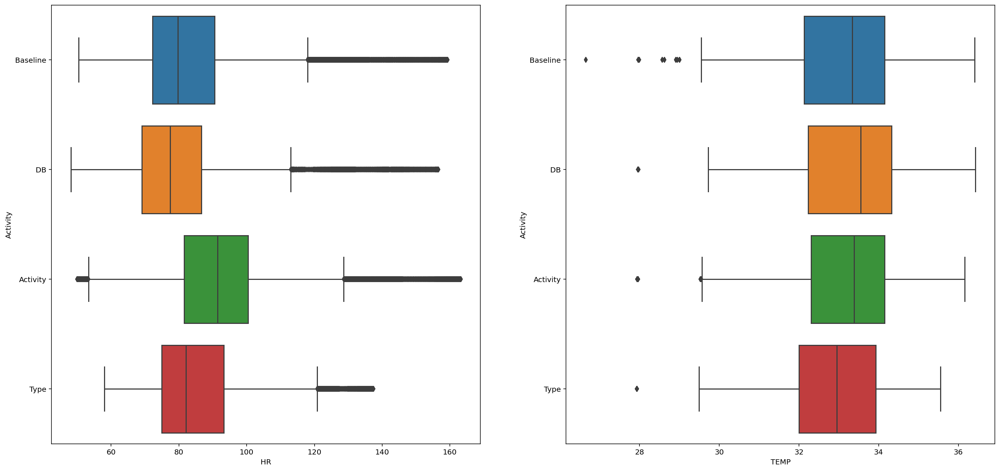

<Figure size 1440x1440 with 0 Axes>

In [69]:
f, axes = plt.subplots(1, 2, figsize = (23,11))
plt.figure(figsize=(20,20))
sns.boxplot(y='Activity', x='HR', data=df1, ax = axes[0])
sns.boxplot(y='Activity', x='TEMP', data=df1, ax = axes[1])

plt.show()

The following visualizations are for the other, less interpretable sensor readings. It is important to again note that presence of outliers here means nothing without the context of physiological impossibility.

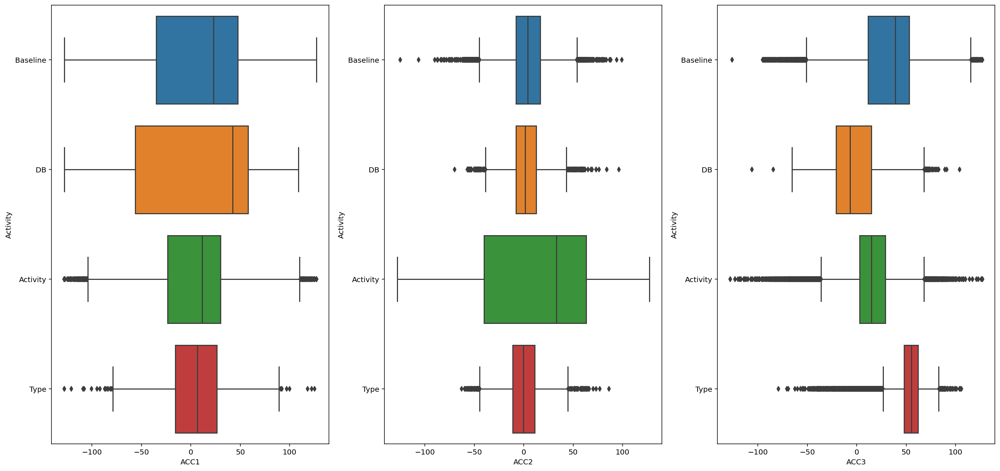

<Figure size 1440x1440 with 0 Axes>

In [70]:
f, axes = plt.subplots(1, 3, figsize = (23,11))
plt.figure(figsize=(20,20))
sns.boxplot(y='Activity', x='ACC1', data=df1, ax = axes[0]) 
sns.boxplot(y='Activity', x='ACC2', data=df1, ax = axes[1])
sns.boxplot(y='Activity', x='ACC3', data=df1, ax = axes[2])

plt.show()

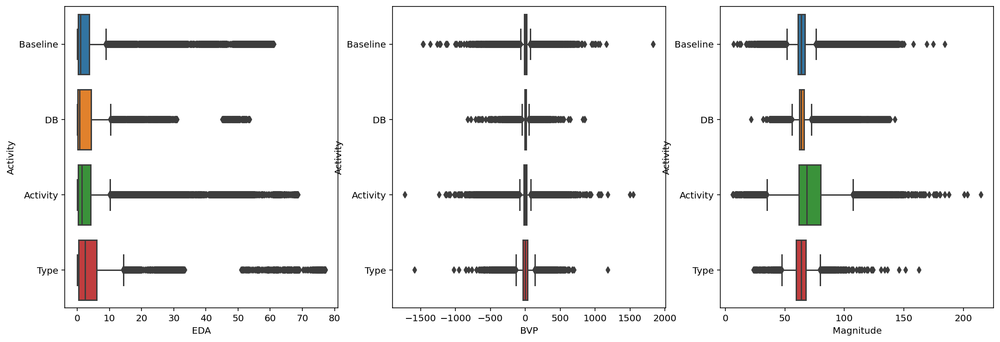

In [71]:
f, axes = plt.subplots(1, 3, figsize = (18,6))
sns.boxplot(y='Activity', x='EDA', data=df1, ax = axes[0])
sns.boxplot(y='Activity', x='BVP', data=df1, ax = axes[1])
sns.boxplot(y='Activity', x='Magnitude', data=df1, ax = axes[2])
plt.show()

## Outliers By Time
<a id="outtime"></a>

Here we can visualize where more extreme values for HR and TEMP come up over the course of one round of an activity (baseline). Each boxplot summarizes 5 seconds of data and boxplots are presented sequentially. 

In [72]:
df_baseline1 = df[df['Activity'] == 'Baseline 1']
df_baseline1['timedelta'] = df_baseline1.Time.astype(int).div(10**9).groupby(df['Subject_ID']).transform(lambda x: x.diff().fillna(0).cumsum())

# Rounded times
df_baseline1['timedelta_round5'] = df_baseline1['timedelta'].div(5).round(0) * 5

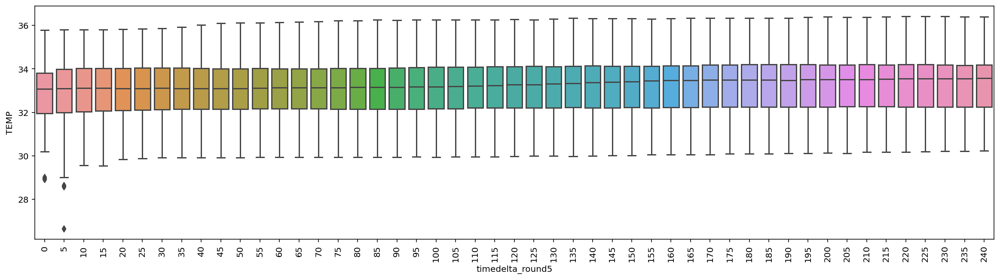

In [73]:
plt.figure(figsize = (20,5))
sns.boxplot(df_baseline1['timedelta_round5'].astype(int), df_baseline1['TEMP'])
plt.xticks(rotation=90)
plt.show()

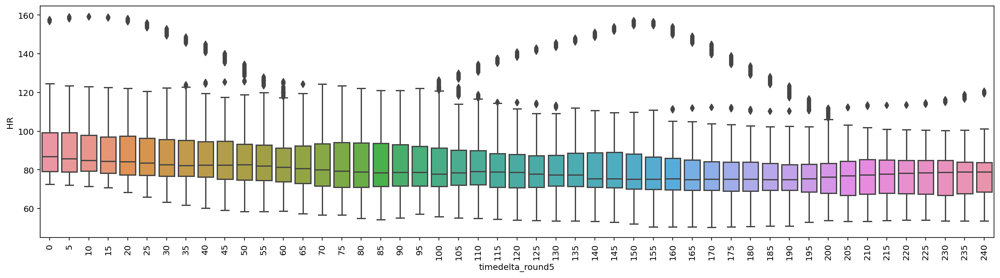

In [74]:
plt.figure(figsize = (20,5))
sns.boxplot(df_baseline1['timedelta_round5'].astype(int), df_baseline1['HR'])
plt.xticks(rotation=90)
plt.show()

### Outliers Analysis

Boxplots over time for each activity (not all activities shown) identified outliers over time. High heart rates occur throughout the baseline activity. There are sparse outliers in temperature, and all occur at the beginning.

This analysis was replicated in Tableau in order to more easily find subjects who were outliers relative to other subjects. The packaged tableau workbook is located at ./21_tableau/Outlier_analysis.twbx.

Through this analysis, the following subjects were identified. 

| Subject ID  | Activity | Sensor | 
|---|---|---|
| 19-015  | Baseline  |  HR |
| 19-019  | All  |  EDA  |
| 19-031  | Baseline  |  HR & EDA |
| 19-035  | Deep Breathing  |  HR |

Further analysis on a subject-level basis will need to be done to determine if these subjects are truly outliers, or are just the result of individual variability. This analysis was done in tableau and is located ./21_tableau/Individual_level_outlier_analysis.twbx 

None of this data suggests that these participants should be removed, but extremeity in and of itself is cause for further investigation. What we have noted here, can be compared to our models when using Leave One Group Out (LOGO) validation. 

When looking at TEMP over time, we see that there are datapoints that have supraphysiological skin temperatures which are not outliers. This is likely an artifact of putting on the wearables, or other sensor noise, and artifacts like these will need to be cleaned to give our model the best training data we are able to.

## Comparing Baseline and Deep Breathing 

<a id="restdb"></a>
The following figures plot individual subject's sensor readings for rounds of either baseline or deep breathing to compare how sensor readings may be different over time per activity within an individual. Additionally, rounds of the same activity may be compared to visualize intraclass variability.

In [75]:
#SUBJECT MUST BE IN STRING FORM

def plot_by_person_db(df, subject):
    
    #filter by subject and activity
    df_new = df[df['Subject_ID'] == subject]
    df_new = df_new[df_new['Activity'].isin(['Baseline 1', 'Baseline 2', 'DB 1', 'DB 2'])]
    df_new_bs1 = df_new[df_new['Activity'] == 'Baseline 1']
    df_new_bs2 = df_new[df_new['Activity'] == 'Baseline 2']
    df_new_db1 = df_new[df_new['Activity'] == 'DB 1']
    df_new_db2 = df_new[df_new['Activity'] == 'DB 2']

    #create plot layout
    fig, axs = plt.subplots(3, 4)
    plt.rcParams['figure.figsize'] = [40, 18]
    plt.rcParams["figure.autolayout"] = True
    plt.rcParams['figure.dpi'] = 100
    #fig.tight_layout()

    #HR
    axs[0,0].plot(df_new_bs1['Time'], df_new_bs1['HR'])
    axs[0,0].title.set_text(subject + ' Rest 1 HR')

    axs[0,1].plot(df_new_bs2['Time'], df_new_bs2['HR'])
    axs[0,1].title.set_text(subject + ' Rest 2 HR')

    axs[0,2].plot(df_new_db1['Time'], df_new_db1['HR'])
    axs[0,2].title.set_text(subject + ' DB 1 HR')

    axs[0,3].plot(df_new_db2['Time'], df_new_db2['HR'])
    axs[0,3].title.set_text(subject + ' DB 2 HR')

    #EDA
    axs[1,0].plot(df_new_bs1['Time'], df_new_bs1['EDA'])
    axs[1,0].title.set_text(subject + ' Rest 1 EDA')

    axs[1,1].plot(df_new_bs2['Time'], df_new_bs2['EDA'])
    axs[1,1].title.set_text(subject + ' Rest 2 EDA')

    axs[1,2].plot(df_new_db1['Time'], df_new_db1['EDA'])
    axs[1,2].title.set_text(subject + ' DB 1 EDA')

    axs[1,3].plot(df_new_db2['Time'], df_new_db2['EDA'])
    axs[1,3].title.set_text(subject + ' DB 2 EDA')

    #Magnitude
    axs[2,0].plot(df_new_bs1['Time'], df_new_bs1['TEMP'])
    axs[2,0].title.set_text(subject + ' Rest 1 Temp')

    axs[2,1].plot(df_new_bs2['Time'], df_new_bs2['TEMP'])
    axs[2,1].title.set_text(subject + ' Rest 2 Temp')

    axs[2,2].plot(df_new_db1['Time'], df_new_db1['TEMP'])
    axs[2,2].title.set_text(subject + 'DB 1 Temp')

    axs[2,3].plot(df_new_db2['Time'], df_new_db2['TEMP'])
    axs[2,3].title.set_text(subject + ' DB 2 Temp')

    plt.show()

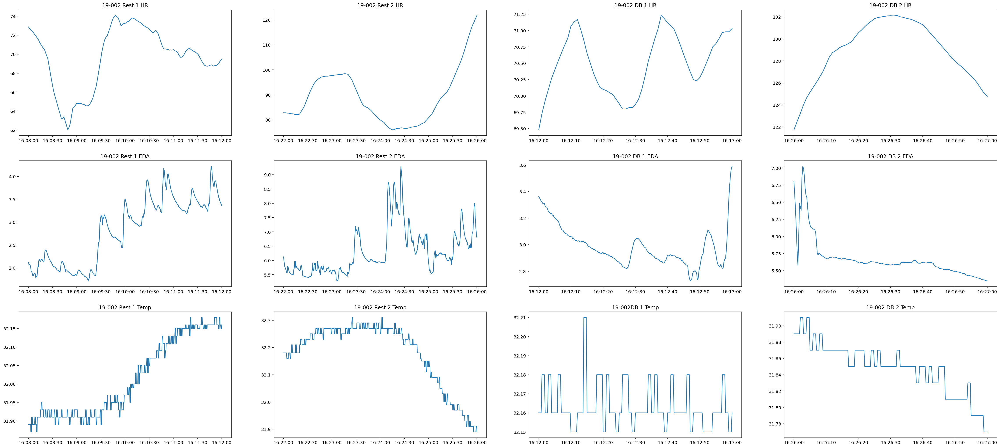

In [76]:
#plot an average subject
plt.rcParams['figure.figsize'] = [40, 18]
plot_by_person_db(df, '19-002')

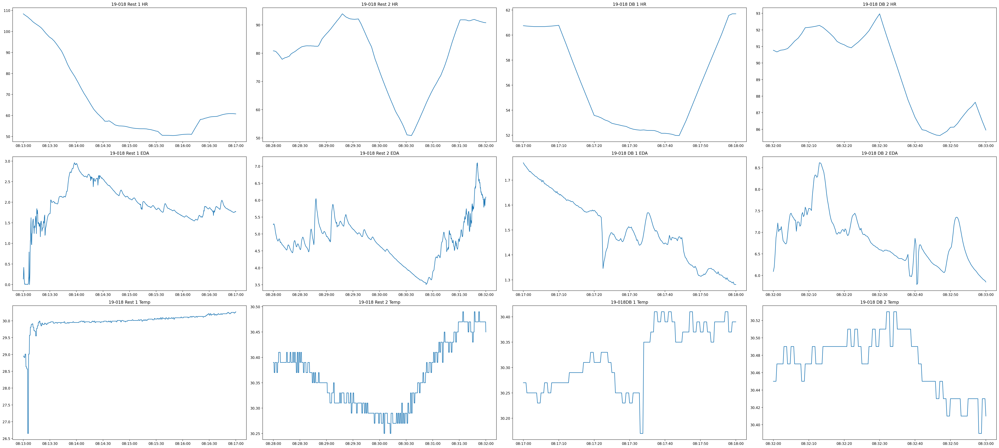

In [77]:
#plot an average subject
plot_by_person_db(df, '19-018')

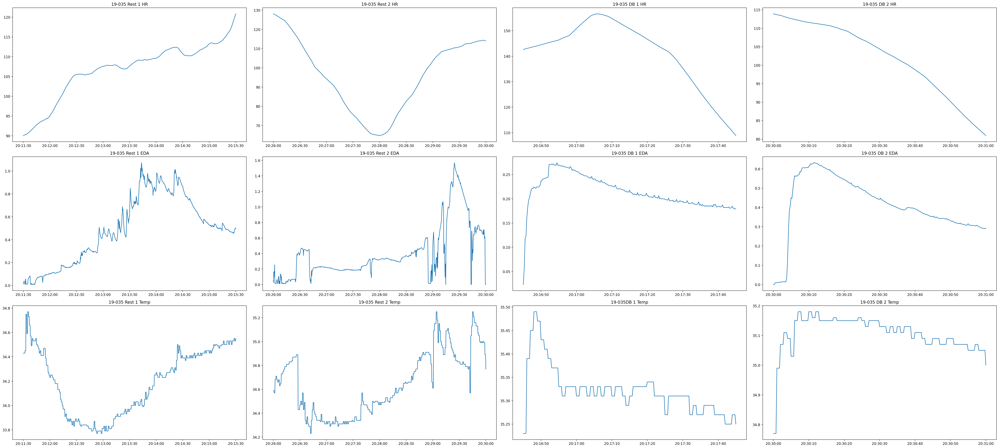

In [78]:
#plot an outlier
plot_by_person_db(df, '19-035')

### Interesting Notes:

1. Deep breathing causes either speeding up or slowing down of heart rate, while baseline shows random HR within the certain range. E.g., HR in deep breathing takes a more linear shape than HR in rest.
2. EDA tends to be at a lower range when deep breathing. There are no differences in the overall change over time through each activity, however.
3. The magnitude of all 3 accelerometer axes shows that there is more variation in movement in the rest period vs. deep breathing.

## Comparing Baseline and Activity 
<a id="restact"></a>
The same kind of comparison is made before, except between Baseline and Activity.

In [79]:
#SUBJECT MUST BE IN STRING FORM

def plot_by_person_act(df, subject):
    
    #filter by subject and activity
    df_new = df[df['Subject_ID'] == subject]
    df_new = df_new[df_new['Activity'].isin(['Baseline 1', 'Baseline 2', 'Activity 1', 'Activity 2'])]
    df_new_bs1 = df_new[df_new['Activity'] == 'Baseline 1']
    df_new_bs2 = df_new[df_new['Activity'] == 'Baseline 2']
    df_new_db1 = df_new[df_new['Activity'] == 'Activity 1']
    df_new_db2 = df_new[df_new['Activity'] == 'Activity 2']

    #create plot layout
    fig, axs = plt.subplots(3, 4)
    plt.rcParams['figure.figsize'] = [40, 18]
    plt.rcParams["figure.autolayout"] = True
    plt.rcParams['figure.dpi'] = 100
    #fig.tight_layout()

    #HR
    axs[0,0].plot(df_new_bs1['Time'], df_new_bs1['HR'])
    axs[0,0].title.set_text(subject + ' Rest 1 HR')

    axs[0,1].plot(df_new_bs2['Time'], df_new_bs2['HR'])
    axs[0,1].title.set_text(subject + ' Rest 2 HR')

    axs[0,2].plot(df_new_db1['Time'], df_new_db1['HR'])
    axs[0,2].title.set_text(subject + ' Activity 1 HR')

    axs[0,3].plot(df_new_db2['Time'], df_new_db2['HR'])
    axs[0,3].title.set_text(subject + ' Activity 2 HR')

    #EDA
    axs[1,0].plot(df_new_bs1['Time'], df_new_bs1['EDA'])
    axs[1,0].title.set_text(subject + ' Rest 1 EDA')

    axs[1,1].plot(df_new_bs2['Time'], df_new_bs2['EDA'])
    axs[1,1].title.set_text(subject + ' Rest 2 EDA')

    axs[1,2].plot(df_new_db1['Time'], df_new_db1['EDA'])
    axs[1,2].title.set_text(subject + ' Activity 1 EDA')

    axs[1,3].plot(df_new_db2['Time'], df_new_db2['EDA'])
    axs[1,3].title.set_text(subject + ' Activity 2 EDA')

    #Magnitude
    axs[2,0].plot(df_new_bs1['Time'], df_new_bs1['Magnitude'])
    axs[2,0].title.set_text(subject + ' Rest 1 Acc')

    axs[2,1].plot(df_new_bs2['Time'], df_new_bs2['Magnitude'])
    axs[2,1].title.set_text(subject + ' Rest 2 Acc')

    axs[2,2].plot(df_new_db1['Time'], df_new_db1['Magnitude'])
    axs[2,2].title.set_text(subject + ' Activity 1 Acc')

    axs[2,3].plot(df_new_db2['Time'], df_new_db2['Magnitude'])
    axs[2,3].title.set_text(subject + ' Activity 2 Acc')

    plt.show()

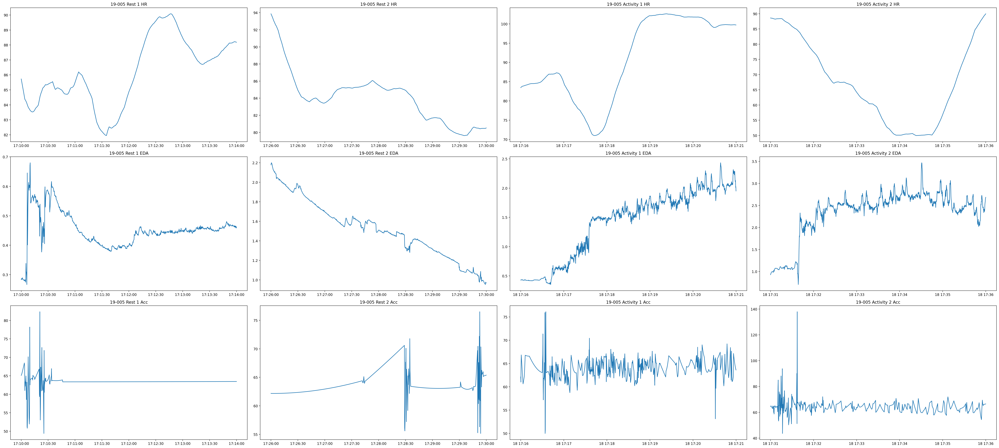

In [80]:
#plot an average participant
plot_by_person_act(df, '19-005')

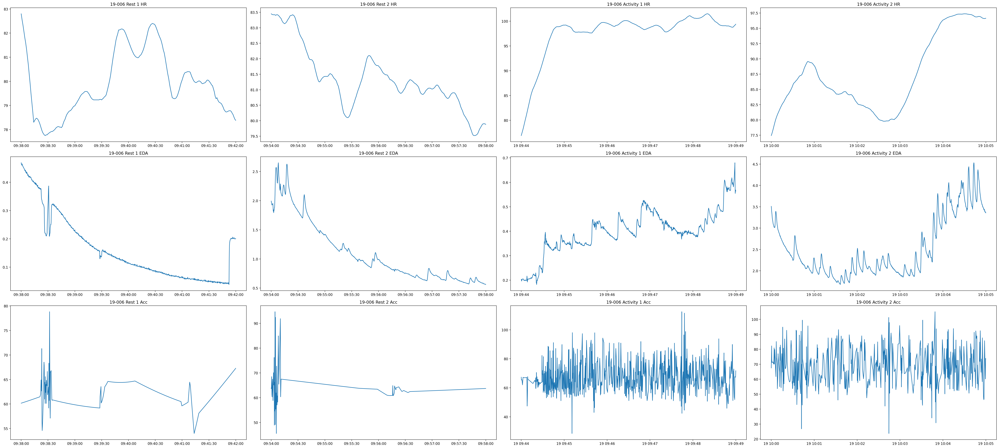

In [81]:
#plot an average participant
plot_by_person_act(df, '19-006')

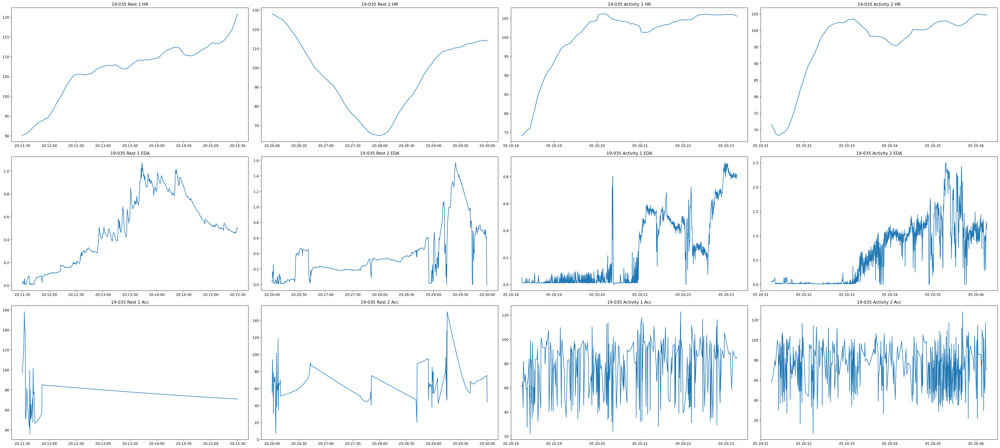

In [82]:
#plot an outlier
plot_by_person_act(df, '19-035')

### Interesting Notes
1. There is undoubtedly a higher range of HR measures in the Activity portion, which matches up with what was suggested by previous histogram visualizations. There is an increase in HR as the Activity continues in these participants as well.

2. There is much more variability in the magnitude of the accelerometry data during Activity, which is perhaps due to arm movement during walking. 

3. EDA tends to be more variable and has a higher range of measures during Activity. Not only is there more stimulation during exercise, sweat during physical activity may be a confounding effect in measuring EDA.

## Plot by Sensor
<a id="pbs"></a>

You can also plot each participant's sensor readings throughout each activity to get a better idea of how each activity is different.

In [88]:
#Sensor must be ACC_, EDA, BVP, HR and in string form

def plot_by_sensor(df, sensor, subject):
    fig, axs = plt.subplots(4, 2)
    plt.rcParams['figure.figsize'] = [40, 18]
    
    #filter by subject
    df_new = df[df['Subject_ID'] == subject]
    
    df_list = []
    
    #for each activity, create new dataframe
    for i in pd.unique(df.Activity):
        df_1 = df_new[df_new['Activity'] == i]
        df_list.append(df_1)
   
    #plot each sensor
    axs[0, 0].plot(df_list[0].Time, df_list[0][sensor])
    axs[0, 0].title.set_text(sensor + " Baseline 1")
    
    axs[0, 1].plot(df_list[1].Time, df_list[1][sensor])
    axs[0, 1].title.set_text(sensor + " Baseline 2")
    
    axs[1, 0].plot(df_list[2].Time, df_list[2][sensor])
    axs[1, 0].title.set_text(sensor + " Deep Breathing 1")
    
    axs[1, 1].plot(df_list[3].Time, df_list[3][sensor])
    axs[1, 1].title.set_text(sensor + " Deep Breathing 2")
    
    axs[2, 0].plot(df_list[4].Time, df_list[4][sensor])
    axs[2, 0].title.set_text(sensor + " Activity 1")
    
    axs[2, 1].plot(df_list[5].Time, df_list[5][sensor])
    axs[2, 1].title.set_text(sensor + " Activity 2")
    
    axs[3, 0].plot(df_list[6].Time, df_list[6][sensor])
    axs[3, 0].title.set_text(sensor + " Typing 1")
    
    axs[3, 1].plot(df_list[7].Time, df_list[7][sensor])
    axs[3, 1].title.set_text(sensor + " Typing 2")
    
    plt.show()

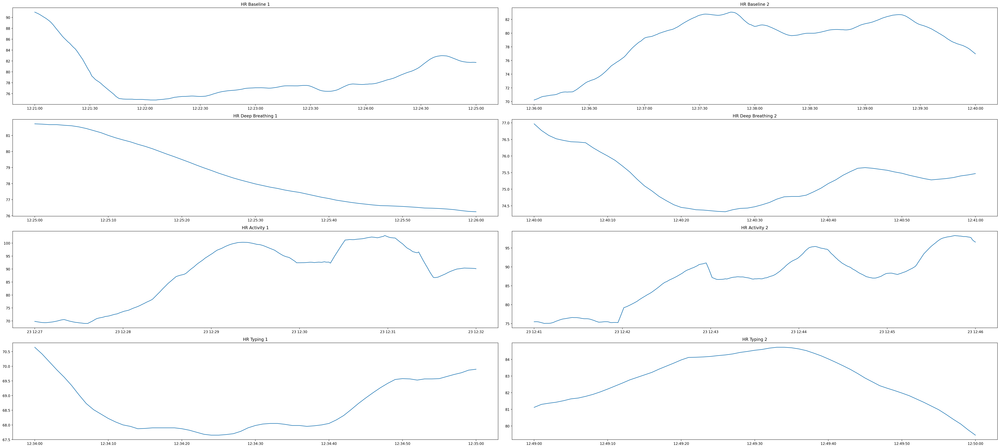

In [89]:
#HR
plot_by_sensor(df, 'HR', '19-010')

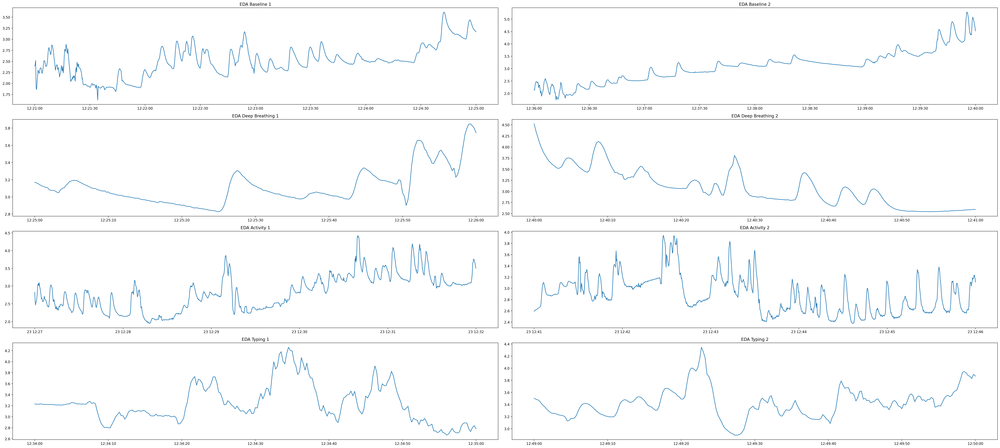

In [90]:
#EDA
plot_by_sensor(df, 'EDA', '19-010')

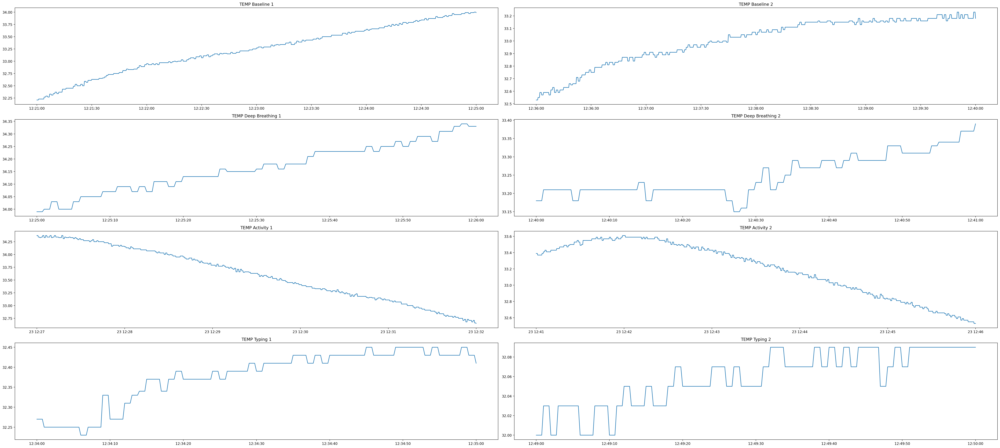

In [91]:
#Temp
plot_by_sensor(df, 'TEMP', '19-010')

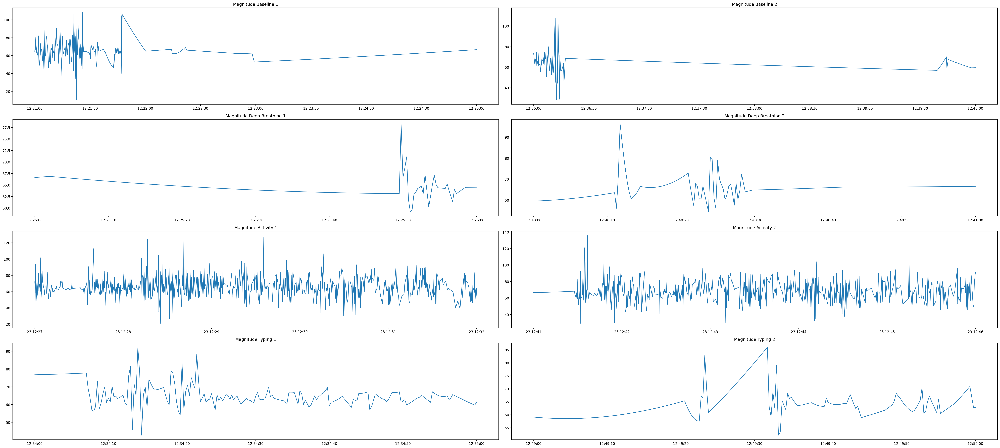

In [92]:
#Magnitude
plot_by_sensor(df, 'Magnitude', '19-010')

### Interesting Notes: 
This layout is great for visualizing how different activities are represented in sensor data.
1. EDA and temp are affected significantly by activity level.
2. The change over time and shape of Magnitude and HR signals represent activity very well. __how compared to the others?__


## Clustering on Sensor Summary Statistics
<a id="cluster"></a>

It's obvious that different people have different physiological makeups. Differences in physiological makeup may be important for classification since readings could look completely different for the same activity. A good classifier will be able to determine activity from multiple physiological profiles. This is an example of domain generalization. Each participant is a different source of data, perhaps a different domain. This clustering is done to see if any obvious general domains exist in our dataset. 

Summary statistics can be used as values to represent different domains to differentiate kinds of physiological profiles. For instance, mean heart rate is an interpretable value that makes sense for people to vary on. The mean heart rate of someone could potentially differentiate them being an athlete or a person who never exercises. The following clustering is done to see if any obvious groups of subjects exist as a particular "kind" of subject. 

If the clustering does not work, that does not mean each subject is not a different domain. It just means that subjects do not fall into easily differentiable groups. If they do fall into differentiable groups, we could look for class imabalances there. Additionally, differentiable groups may further motivate DL techniques that prioritize domain generalization.

In [ ]:
summary = pd.DataFrame()

for i in range(1,57):
    if i < 10:
        summary[i] = a1.loc[a1['Subject_ID'] == '19-00'+str(i)].TEMP.describe()     
    if i >= 10:
        summary[i] = a1.loc[a1['Subject_ID'] == '19-0'+str(i)].TEMP.describe()
summary = summary.transpose()
summary = summary.drop('count', axis =1)
summary.head()

In [ ]:
plt.scatter(summary['mean'],summary['std'])

In [ ]:
plt.scatter(summary['50%'],summary['std'])

In [ ]:
test = summary[['mean','std']]



In [ ]:
import sklearn
from sklearn.cluster import KMeans
k = 5
kmeans = KMeans(n_clusters=k)
y_pred = kmeans.fit_predict(test)

plt.scatter(test['mean'], test['std'], c=y_pred, s=50, cmap='viridis')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);


In [ ]:
h = .02
x_min = test['mean'].min() - 1
y_min = test['std'].min() - 1
x_max = test['mean'].max() + 1
y_max = test['std'].max() + 1

xx, yy = np.meshgrid(np.arange(x_min,x_max,h), np.arange(y_min, y_max, h))
  
Z = kmeans.predict(np.c_[xx.ravel(), yy.ravel()])

Z = Z.reshape(xx.shape)
plt.figure(1)
plt.clf()
plt.imshow(Z, interpolation='nearest',
       extent=(xx.min(), xx.max(), yy.min(), yy.max()),
       cmap=plt.cm.Paired,
       aspect='auto', origin='lower')

plt.plot(test['mean'], test['std'], 'k.', markersize=2)
# Plot the centroids as a white X
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1],
        marker='x', s=169, linewidths=3,
        color='w', zorder=10)
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.xticks(())
plt.yticks(())
plt.show()

There do not appear to be obvious clusters in the data that would easily group participants. Fortunately then, we do not have to worry about class imbalances for different "kinds" of physiological profiles.

We do still have to worry about domain generalization though. Each participant is still their own "domain" because it is an undeniable fact that different physiological profiles exist. Therefore any testing set of a model must include participants (domains) the model did not train on. Further, specific techniques may be implemented in DL model creation to emphasize domain generalizability. 

## 3D Animation of Accelerometer
<a id="3D"></a>

After attempting to plot all 3 accelerometry axes on 3d plots, it was evident that they were very uninterpretable. Animating these plots allows one to see the change over time of the accelerometry measures, effectively representing the movement in three dimensions over that interval.

In [ ]:
from mpl_toolkits import mplot3d

In [ ]:
#I would recommend making interval 50 or below. This will shorten the video as much as possible.
#Subject and activity must be strings.
#This can run upwards of 5 minutes.

def animation3d(df, subject, activity, interval):
    fig = plt.figure()
    ax = p3.Axes3D(fig)
    #plt.clf()
    
    ax.clear()
    ax.set_xlabel("x")
    ax.set_ylabel("y")
    ax.set_zlabel("z")
    
    plt.rcParams['animation.html'] = 'html5'
    plt.rcParams['figure.figsize'] = [30, 18]

    df_new = df[(df['Subject_ID'] == subject) & (df['Activity'] == activity)]
    
    x1 = df_new['ACC1']
    y1 = df_new['ACC2']
    z1 = df_new['ACC3']
    
    lns = []
    for i in range(len(df_new['ACC1'])):
        ln1 = ax.plot(x1[:i], y1[:i], z1[:i], 'o-', color='steelblue')
        lns.append(ln1)

    line_ani = animation.ArtistAnimation(fig, lns, interval=interval, blit=False)
    return line_ani

In [ ]:
animation3d(df, '19-015', 'Activity 2', 25)

Unfortunately, the animation function is inefficient, and it was not a priority to make many videos to compare movements between activities and subjects.